In [1]:
# Libraries
from google.colab import drive
import pandas as pd
import geopandas as gpd

In [2]:
# Data uploads
drive.mount('/content/drive')

# File paths
file_path = "/content/drive/My Drive/all_feature_data_avg.csv"

# Reading in as pd dfs
avg_df = pd.read_csv(file_path)

Mounted at /content/drive


In [3]:
avg_df.shape

(45338, 16)

In [4]:
avg_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45338 entries, 0 to 45337
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  45338 non-null  int64  
 1   year_index  45338 non-null  int64  
 2   index       45338 non-null  int64  
 3   id2         45338 non-null  int64  
 4   year        45338 non-null  int64  
 5   yield       45338 non-null  float64
 6   tmmx        45338 non-null  float64
 7   rmax        45338 non-null  float64
 8   vs          45338 non-null  float64
 9   sph         45338 non-null  float64
 10  srad        45338 non-null  float64
 11  vpd         45338 non-null  float64
 12  rmin        45338 non-null  float64
 13  pr          45338 non-null  float64
 14  tmmn        45338 non-null  float64
 15  th          45338 non-null  float64
dtypes: float64(11), int64(5)
memory usage: 5.5 MB


In [5]:
avg_df.head()

,Unnamed: 0,year_index,index,id2,year,yield,tmmx,rmax,vs,sph,srad,vpd,rmin,pr,tmmn,th
0,0,0,1,112,1980,27.0,302.547299,88.534865,4.169133,0.010406,244.856055,1.477316,34.108888,2.150448,287.698991,182.028998
1,1,1,2,113,1980,28.0,302.068878,85.865079,3.564974,0.010097,243.893545,1.461499,34.400296,2.342725,287.706825,192.143968
2,2,2,3,119,1980,29.0,303.100471,91.763880,3.560391,0.011191,251.878185,1.429625,36.004177,2.067676,288.491839,178.083970
3,3,3,4,120,1980,28.0,302.966961,88.569844,3.964970,0.010669,250.073255,1.484913,35.960727,2.714061,288.009203,192.123030
4,4,4,5,124,1980,24.0,303.312180,89.555033,3.494477,0.011313,254.001956,1.481304,36.824029,2.435780,289.358179,176.449627


In [6]:
# Reading in shp file
shapefile_path = '/content/drive/MyDrive/CornBeltCounty.shp'

shp_gdf = gpd.read_file(shapefile_path)

In [7]:
shp_gdf.shape

(1443, 13)

In [8]:
shp_gdf.head()

,ID_0,ISO,NAME_0,ID_1,NAME_1,ID_2,NAME_2,TYPE_2,ENGTYPE_2,NL_NAME_2,VARNAME_2,Area,geometry
0,244,USA,United States,4,Arkansas,111,Baxter,County,County,None,None,1.512190e+09,"POLYGON ((-92.15934 36.26188, -92.1603 36.1743..."
1,244,USA,United States,4,Arkansas,112,Benton,County,County,None,None,2.264963e+09,"POLYGON ((-94.07601 36.49915, -93.90713 36.498..."
2,244,USA,United States,4,Arkansas,113,Boone,County,County,None,None,1.558393e+09,"POLYGON ((-92.85413 36.49659, -92.85547 36.463..."
3,244,USA,United States,4,Arkansas,116,Carroll,County,County,None,None,1.650783e+09,"POLYGON ((-93.58427 36.49754, -93.36903 36.496..."
4,244,USA,United States,4,Arkansas,119,Clay,County,County,None,None,1.650761e+09,"POLYGON ((-90.21961 36.49638, -90.15357 36.496..."


In [9]:
# Merge avg_df onto shp_gdf
merged_gdf = shp_gdf.merge(avg_df, left_on='ID_2', right_on='id2')

# Check result
print(merged_gdf.head())
print(merged_gdf.columns)

   ID_0  ISO         NAME_0  ID_1    NAME_1  ID_2  NAME_2  TYPE_2 ENGTYPE_2  \
0   244  USA  United States     4  Arkansas   111  Baxter  County    County   
1   244  USA  United States     4  Arkansas   112  Benton  County    County   
2   244  USA  United States     4  Arkansas   112  Benton  County    County   
3   244  USA  United States     4  Arkansas   112  Benton  County    County   
4   244  USA  United States     4  Arkansas   112  Benton  County    County   

  NL_NAME_2  ...        tmmx       rmax        vs       sph        srad  \
0      None  ...  300.556472  94.731915  3.240364  0.010739  228.479969   
1      None  ...  302.547299  88.534865  4.169133  0.010406  244.856055   
2      None  ...  299.662715  95.321876  3.881016  0.011460  223.559744   
3      None  ...  300.041649  94.122967  3.775011  0.011079  232.081297   
4      None  ...  300.639303  94.097118  3.815043  0.010995  237.410359   

        vpd       rmin        pr        tmmn          th  
0  1.027320  40

In [10]:
merged_gdf.shape

(45338, 29)

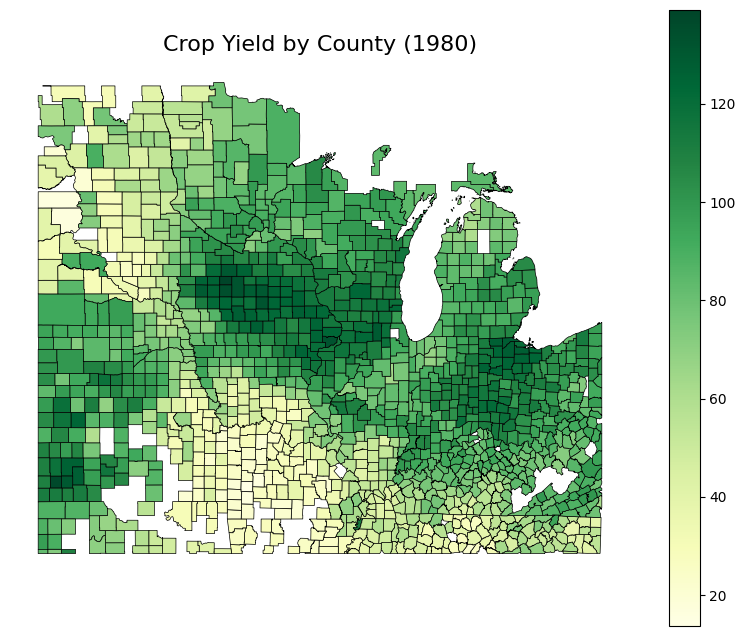

In [11]:
import matplotlib.pyplot as plt

# Filter to just year 1980
gdf_1980 = merged_gdf[merged_gdf["year"] == 1980]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1980.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1980)", fontsize=16)
ax.axis("off")
plt.show()


In [12]:
# Checks
print(len(gdf_1980))
print(gdf_1980.total_bounds)

1302
[-101.99996948   35.50001526  -80.           49.10003662]


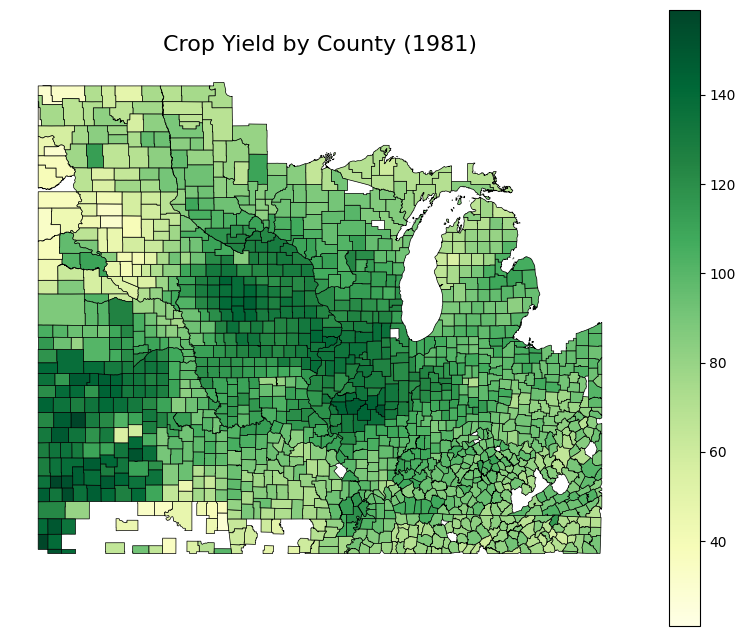

In [13]:
gdf_1981 = merged_gdf[merged_gdf["year"] == 1981]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1981.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1981)", fontsize=16)
ax.axis("off")
plt.show()

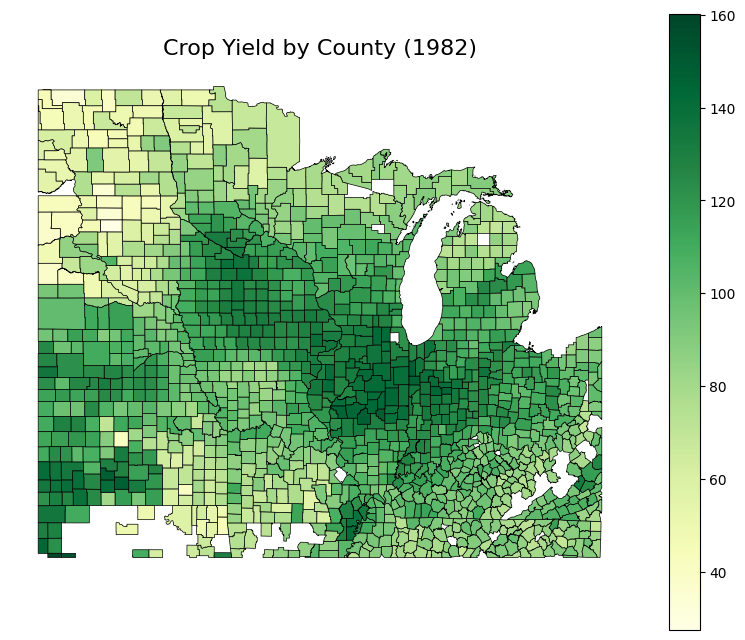

In [14]:
gdf_1982 = merged_gdf[merged_gdf["year"] == 1982]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1982.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1982)", fontsize=16)
ax.axis("off")
plt.show()

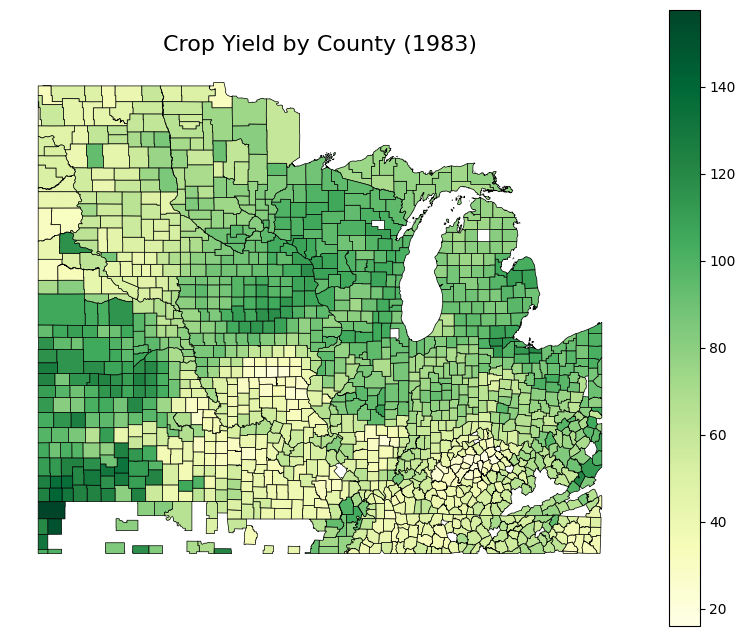

In [15]:
gdf_1983 = merged_gdf[merged_gdf["year"] == 1983]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1983.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1983)", fontsize=16)
ax.axis("off")
plt.show()

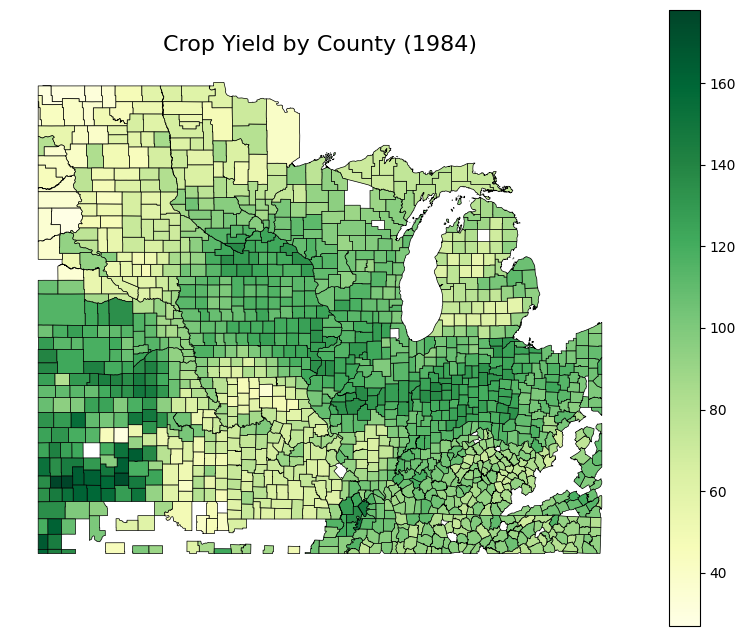

In [16]:
gdf_1984 = merged_gdf[merged_gdf["year"] == 1984]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1984.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1984)", fontsize=16)
ax.axis("off")
plt.show()

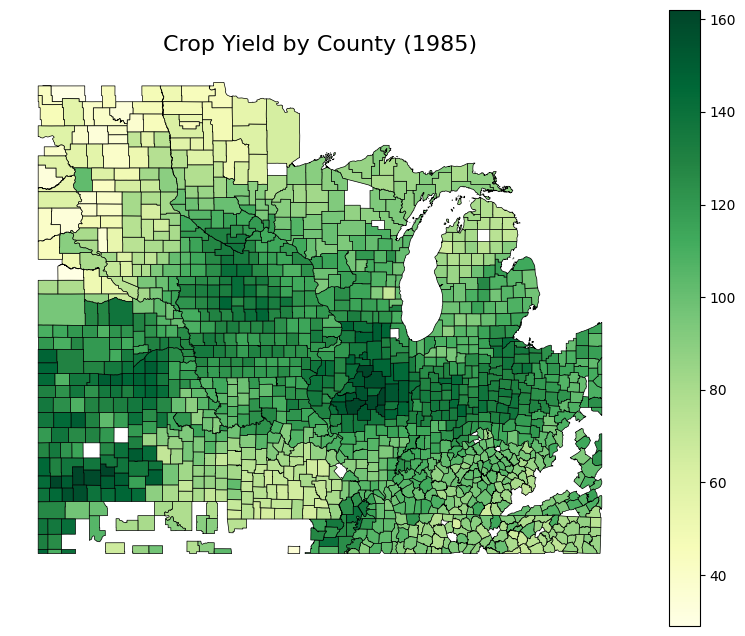

In [17]:
gdf_1985 = merged_gdf[merged_gdf["year"] == 1985]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1985.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1985)", fontsize=16)
ax.axis("off")
plt.show()

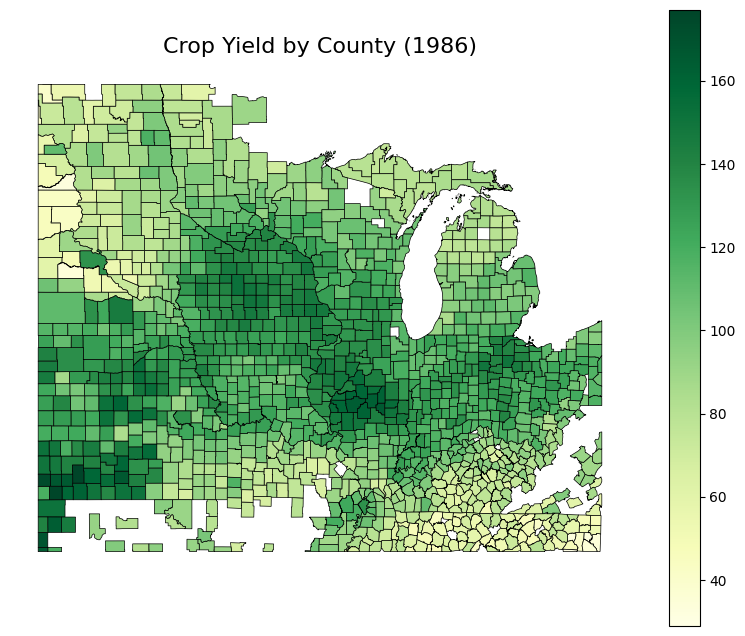

In [18]:
gdf_1986 = merged_gdf[merged_gdf["year"] == 1986]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1986.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1986)", fontsize=16)
ax.axis("off")
plt.show()

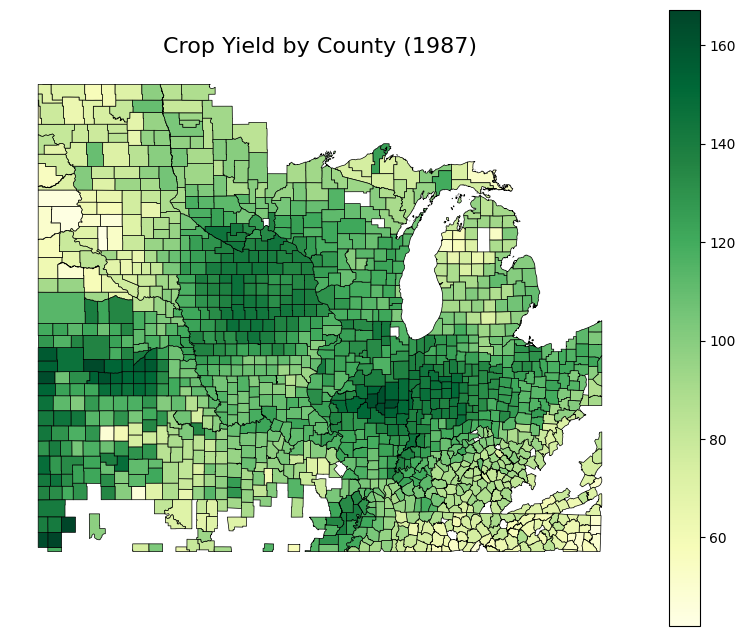

In [19]:
gdf_1987 = merged_gdf[merged_gdf["year"] == 1987]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1987.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1987)", fontsize=16)
ax.axis("off")
plt.show()

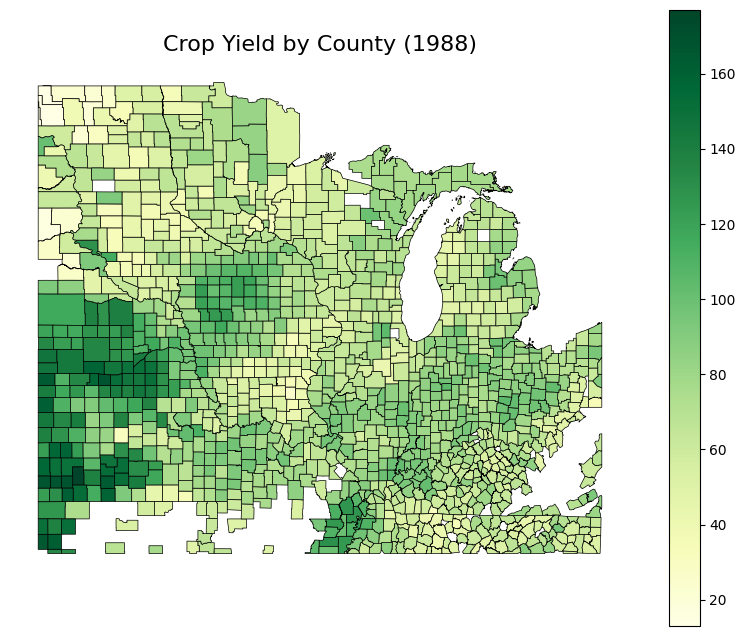

In [20]:
gdf_1988 = merged_gdf[merged_gdf["year"] == 1988]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1988.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1988)", fontsize=16)
ax.axis("off")
plt.show()

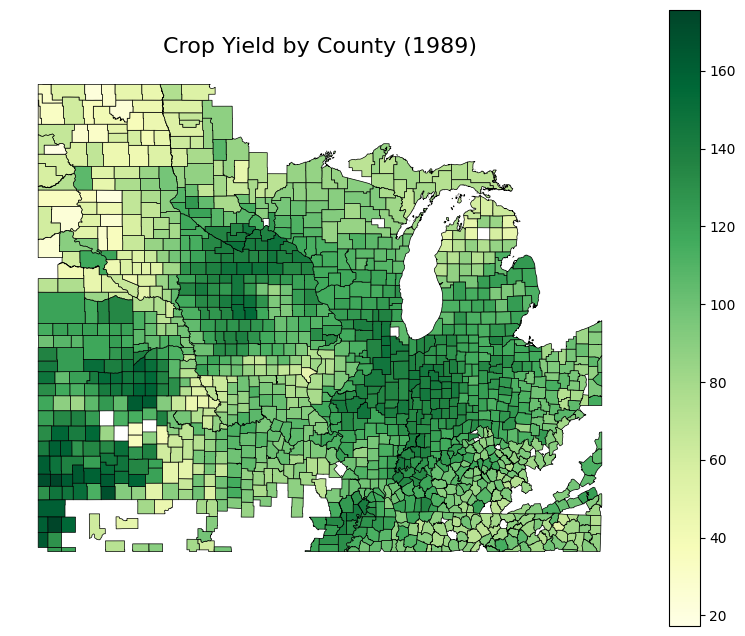

In [21]:
gdf_1989 = merged_gdf[merged_gdf["year"] == 1989]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1989.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1989)", fontsize=16)
ax.axis("off")
plt.show()

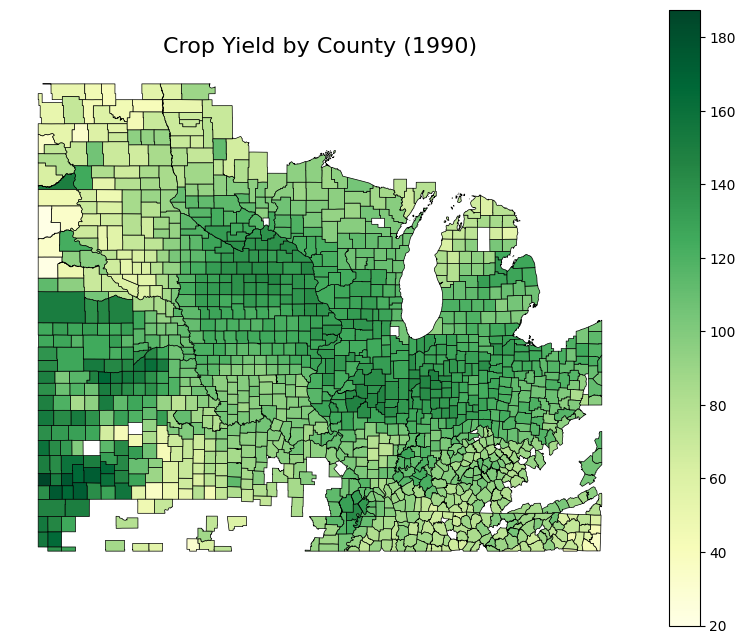

In [22]:
gdf_1990 = merged_gdf[merged_gdf["year"] == 1990]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1990.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1990)", fontsize=16)
ax.axis("off")
plt.show()

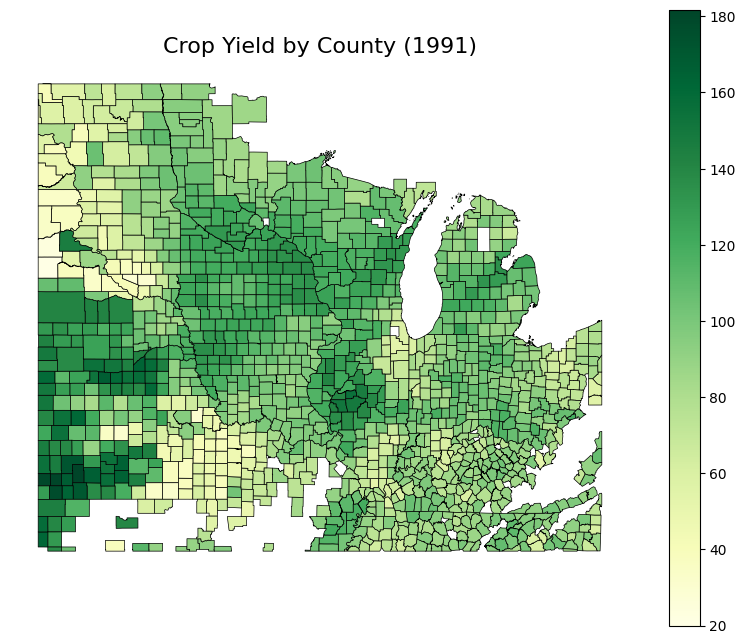

In [23]:
gdf_1991 = merged_gdf[merged_gdf["year"] == 1991]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1991.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1991)", fontsize=16)
ax.axis("off")
plt.show()

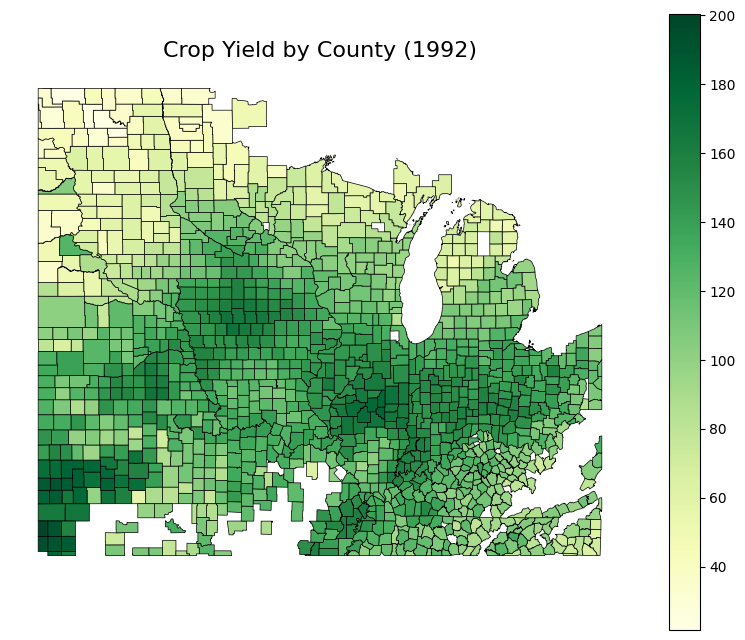

In [24]:
gdf_1992 = merged_gdf[merged_gdf["year"] == 1992]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1992.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1992)", fontsize=16)
ax.axis("off")
plt.show()

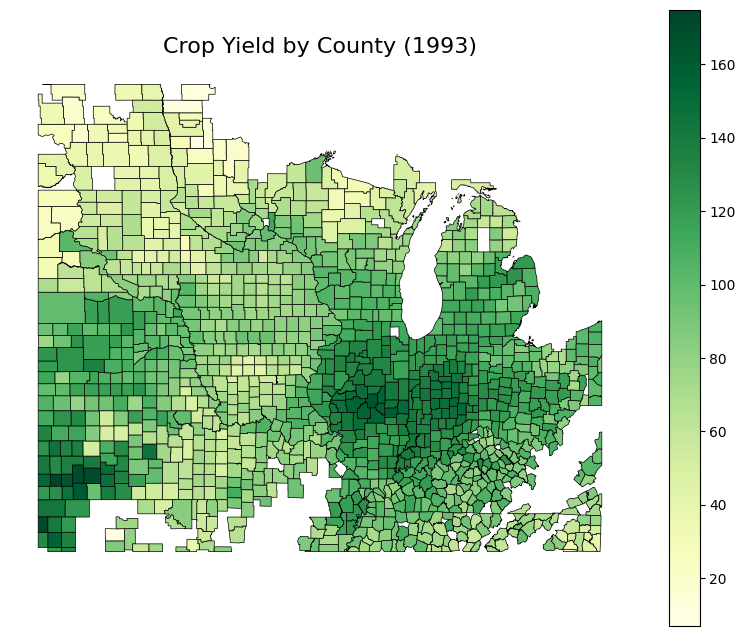

In [25]:
gdf_1993 = merged_gdf[merged_gdf["year"] == 1993]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1993.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1993)", fontsize=16)
ax.axis("off")
plt.show()

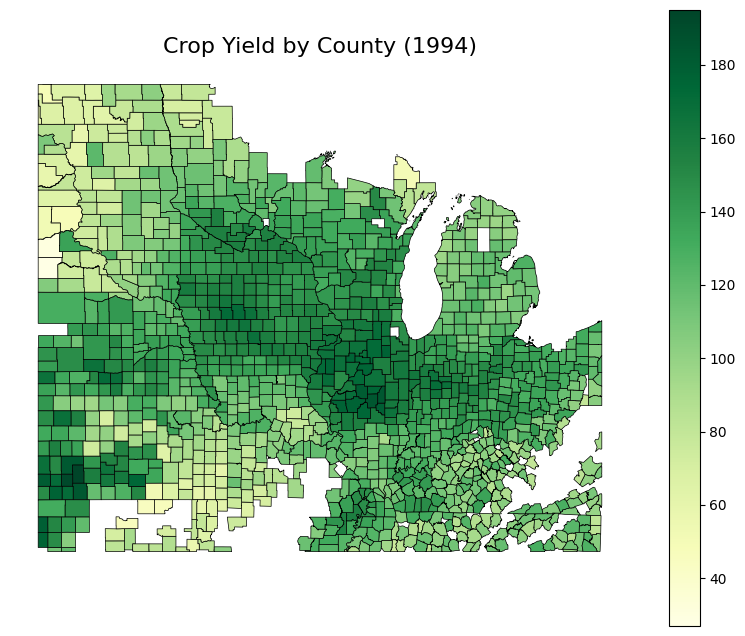

In [26]:
gdf_1994 = merged_gdf[merged_gdf["year"] == 1994]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1994.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1994)", fontsize=16)
ax.axis("off")
plt.show()

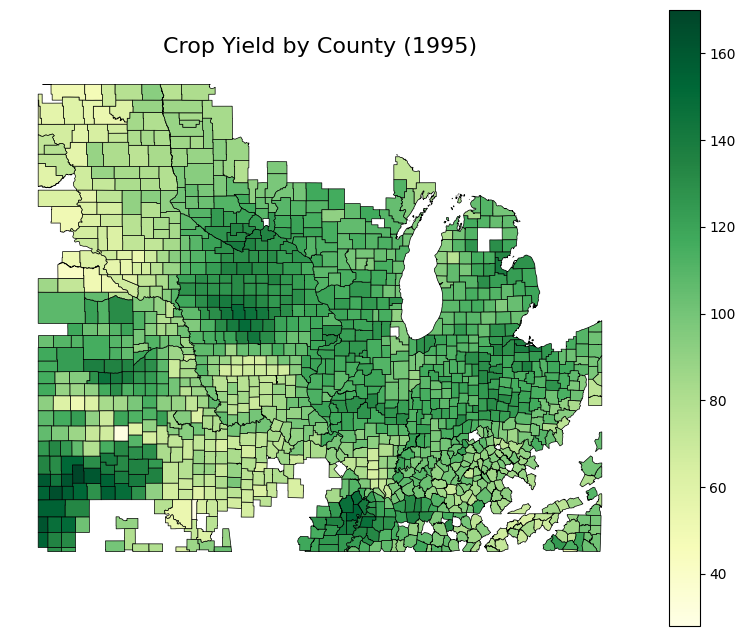

In [27]:
gdf_1995 = merged_gdf[merged_gdf["year"] == 1995]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1995.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1995)", fontsize=16)
ax.axis("off")
plt.show()


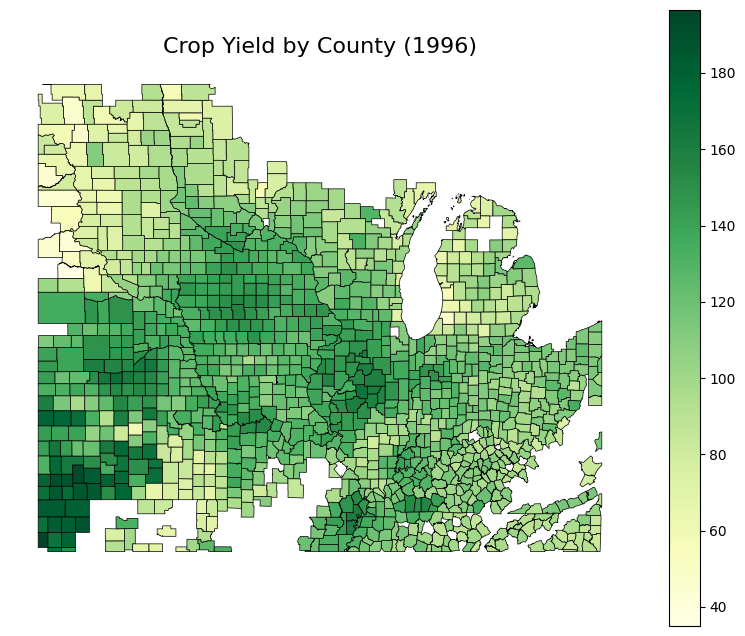

In [28]:
gdf_1996 = merged_gdf[merged_gdf["year"] == 1996]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1996.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1996)", fontsize=16)
ax.axis("off")
plt.show()


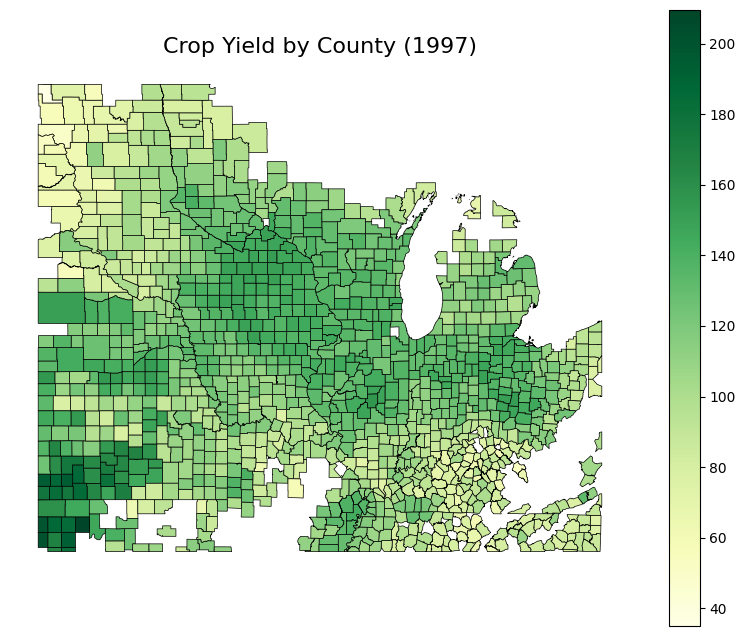

In [29]:
gdf_1997 = merged_gdf[merged_gdf["year"] == 1997]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1997.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1997)", fontsize=16)
ax.axis("off")
plt.show()


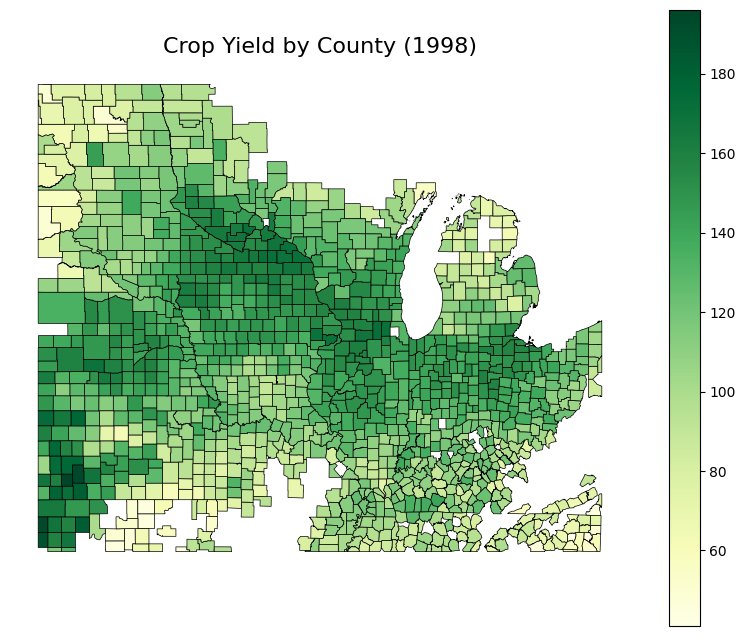

In [30]:
gdf_1998 = merged_gdf[merged_gdf["year"] == 1998]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1998.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1998)", fontsize=16)
ax.axis("off")
plt.show()


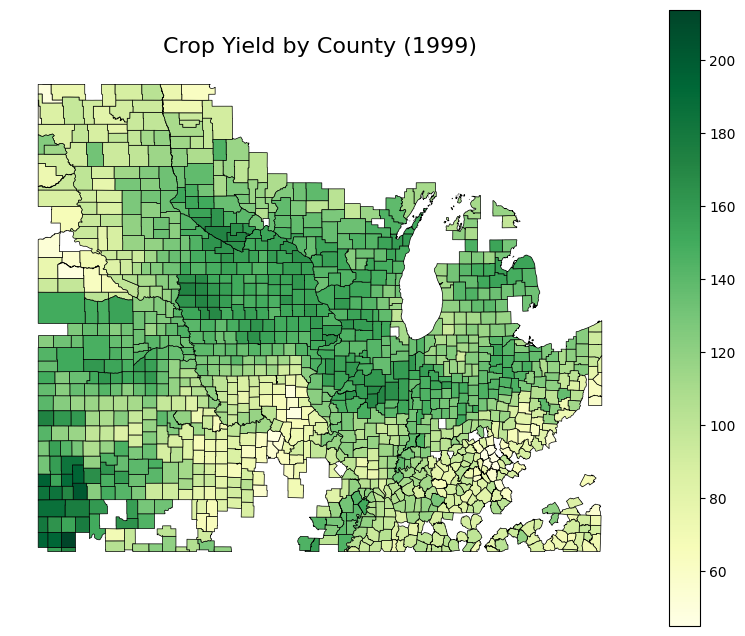

In [31]:
gdf_1999 = merged_gdf[merged_gdf["year"] == 1999]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_1999.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (1999)", fontsize=16)
ax.axis("off")
plt.show()


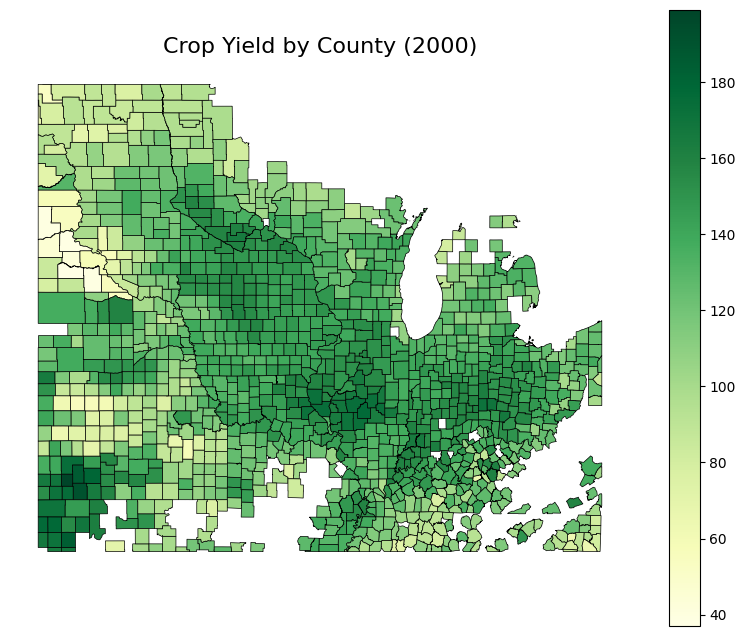

In [32]:
gdf_2000 = merged_gdf[merged_gdf["year"] == 2000]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2000.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2000)", fontsize=16)
ax.axis("off")
plt.show()


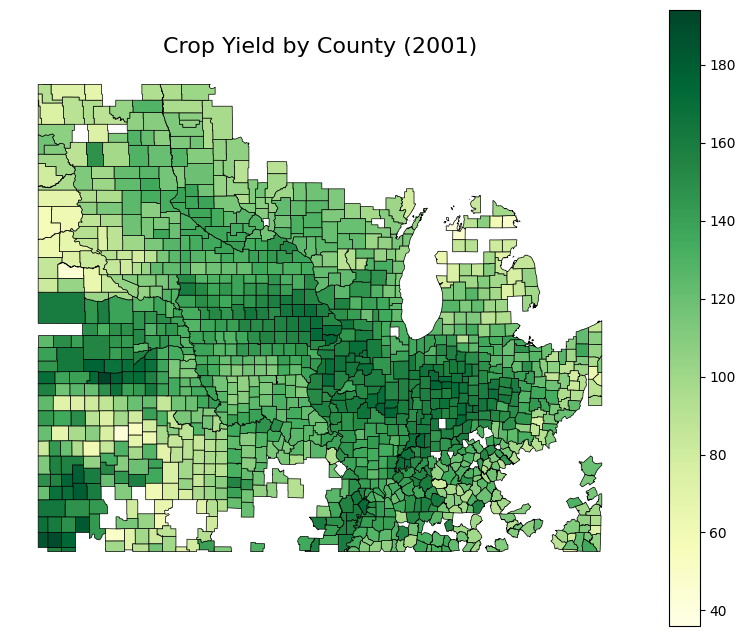

In [33]:
gdf_2001 = merged_gdf[merged_gdf["year"] == 2001]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2001.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2001)", fontsize=16)
ax.axis("off")
plt.show()


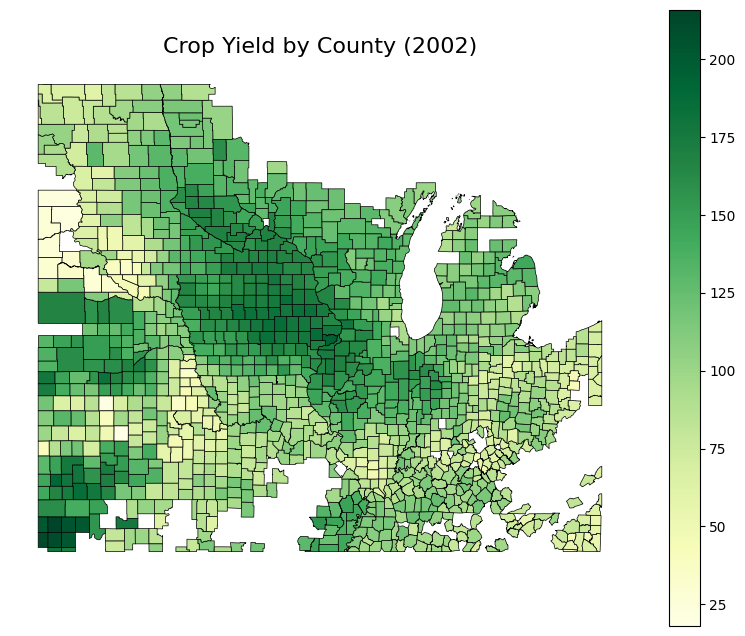

In [34]:
gdf_2002 = merged_gdf[merged_gdf["year"] == 2002]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2002.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2002)", fontsize=16)
ax.axis("off")
plt.show()


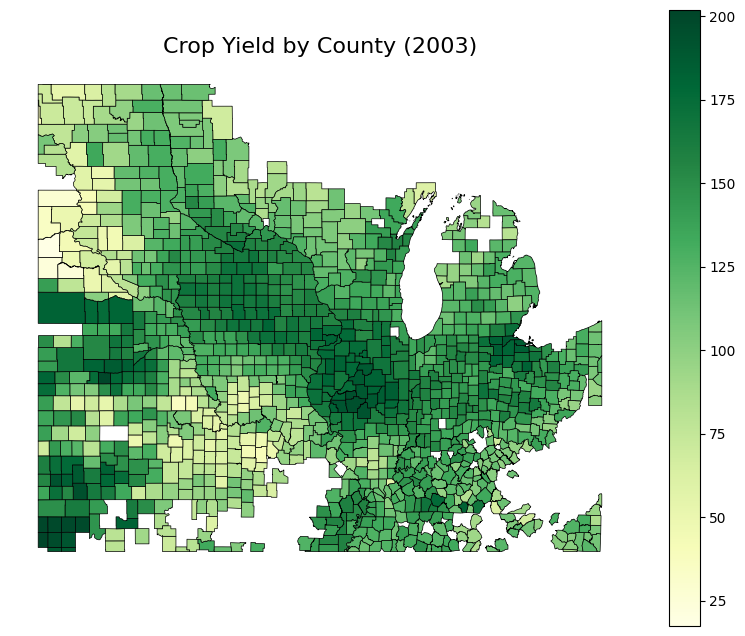

In [35]:
gdf_2003 = merged_gdf[merged_gdf["year"] == 2003]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2003.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2003)", fontsize=16)
ax.axis("off")
plt.show()


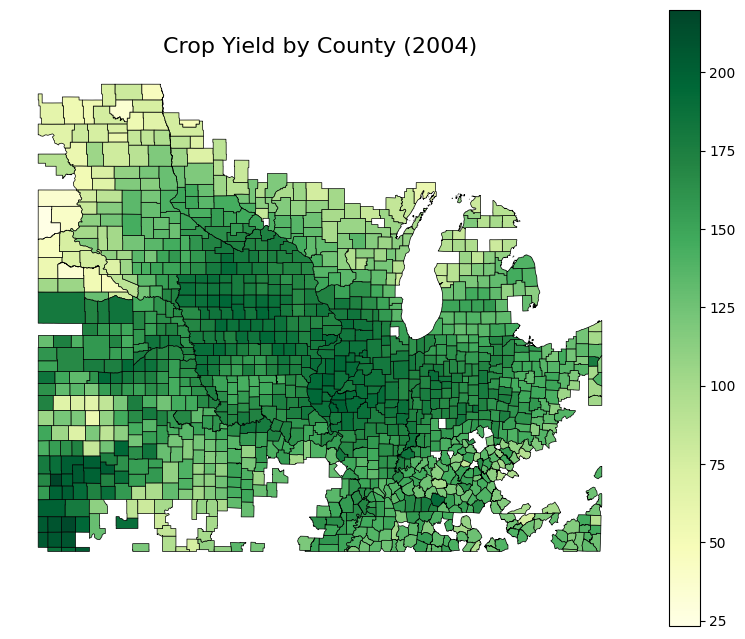

In [36]:
gdf_2004 = merged_gdf[merged_gdf["year"] == 2004]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2004.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2004)", fontsize=16)
ax.axis("off")
plt.show()


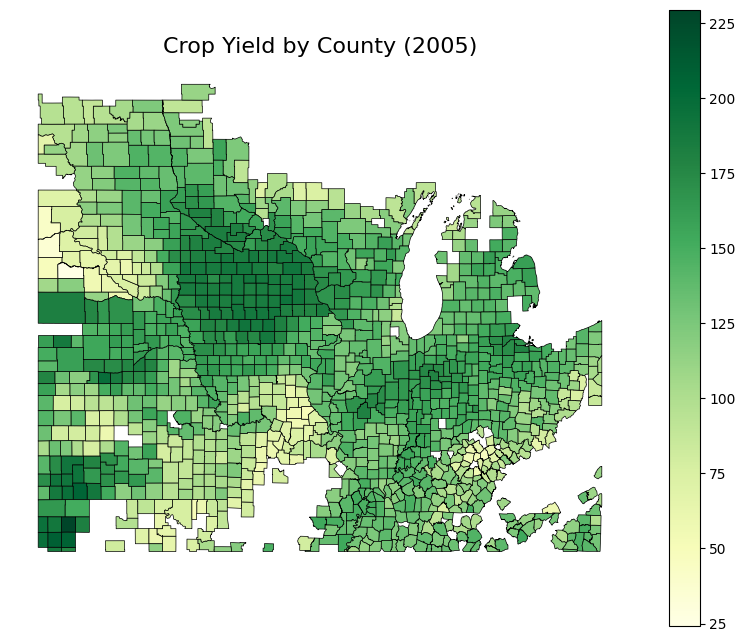

In [37]:
gdf_2005 = merged_gdf[merged_gdf["year"] == 2005]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2005.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2005)", fontsize=16)
ax.axis("off")
plt.show()


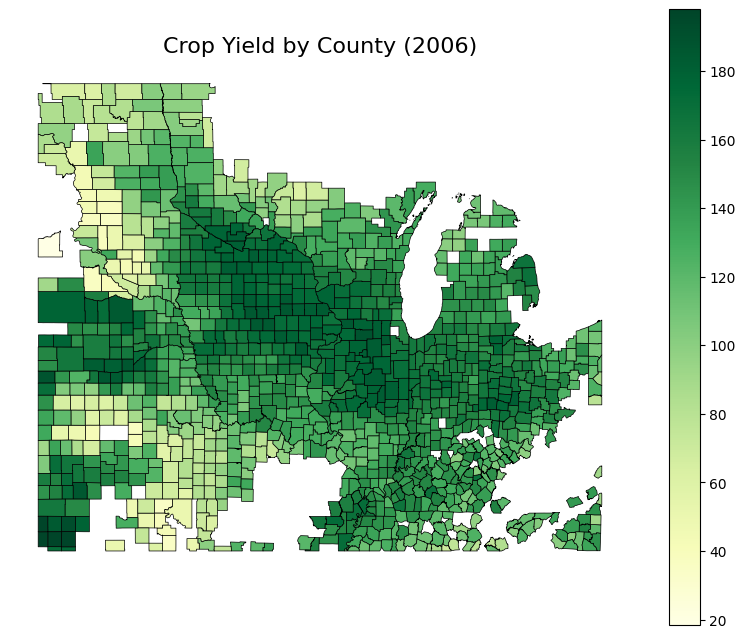

In [38]:
gdf_2006 = merged_gdf[merged_gdf["year"] == 2006]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2006.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2006)", fontsize=16)
ax.axis("off")
plt.show()


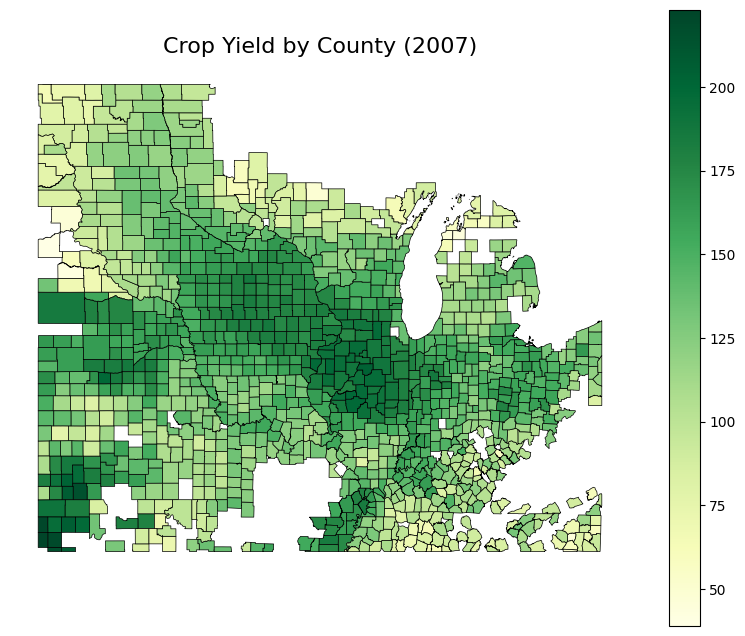

In [39]:
gdf_2007 = merged_gdf[merged_gdf["year"] == 2007]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2007.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2007)", fontsize=16)
ax.axis("off")
plt.show()


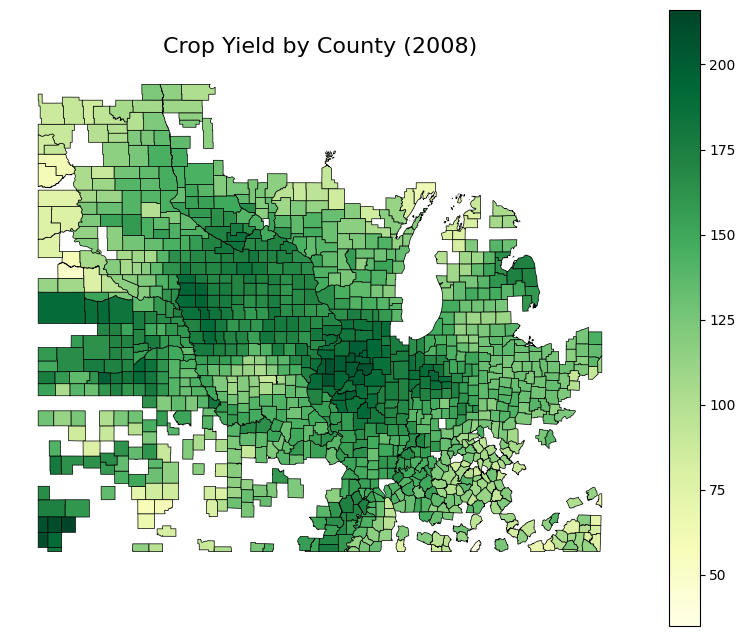

In [40]:
gdf_2008 = merged_gdf[merged_gdf["year"] == 2008]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2008.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2008)", fontsize=16)
ax.axis("off")
plt.show()


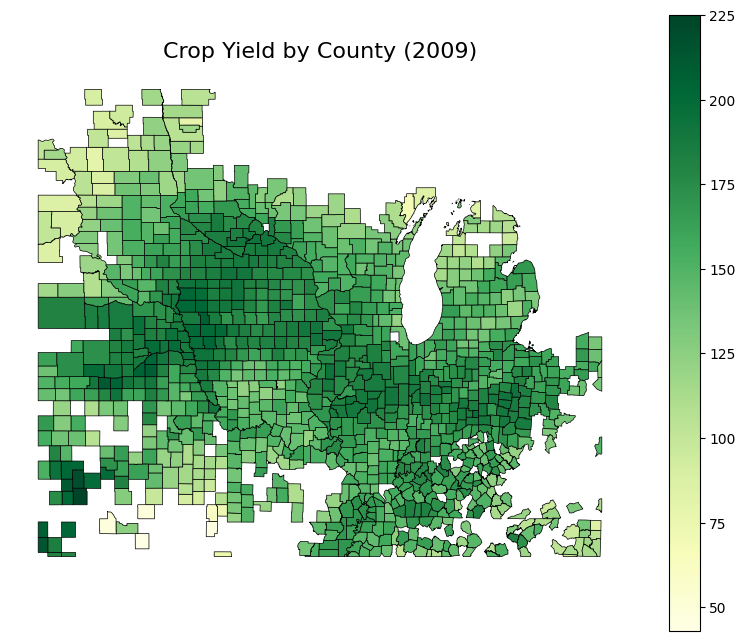

In [41]:
gdf_2009 = merged_gdf[merged_gdf["year"] == 2009]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2009.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2009)", fontsize=16)
ax.axis("off")
plt.show()


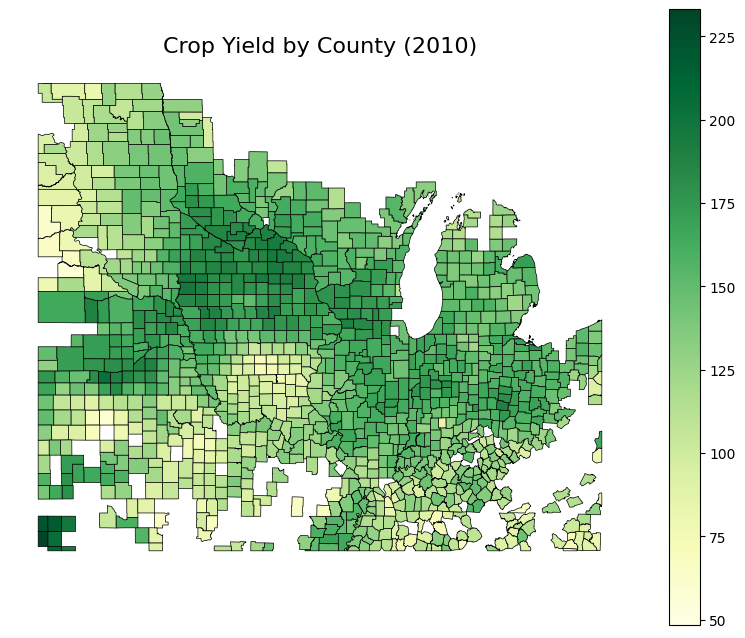

In [42]:
gdf_2010 = merged_gdf[merged_gdf["year"] == 2010]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2010.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2010)", fontsize=16)
ax.axis("off")
plt.show()


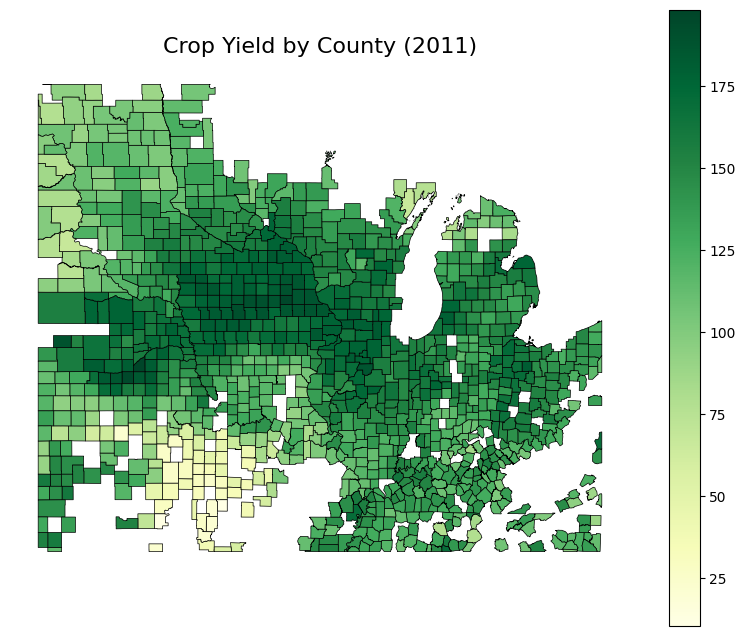

In [43]:
gdf_2011 = merged_gdf[merged_gdf["year"] == 2011]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2011.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2011)", fontsize=16)
ax.axis("off")
plt.show()


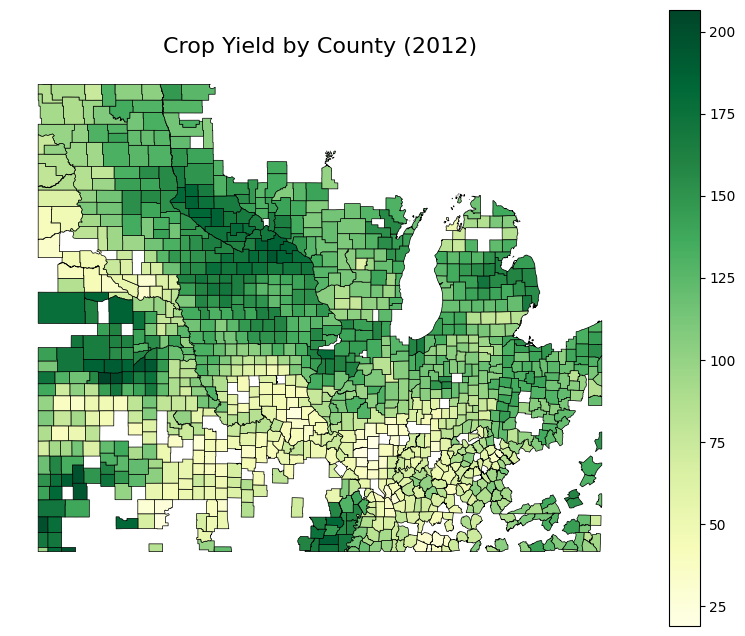

In [44]:
gdf_2012 = merged_gdf[merged_gdf["year"] == 2012]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2012.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2012)", fontsize=16)
ax.axis("off")
plt.show()


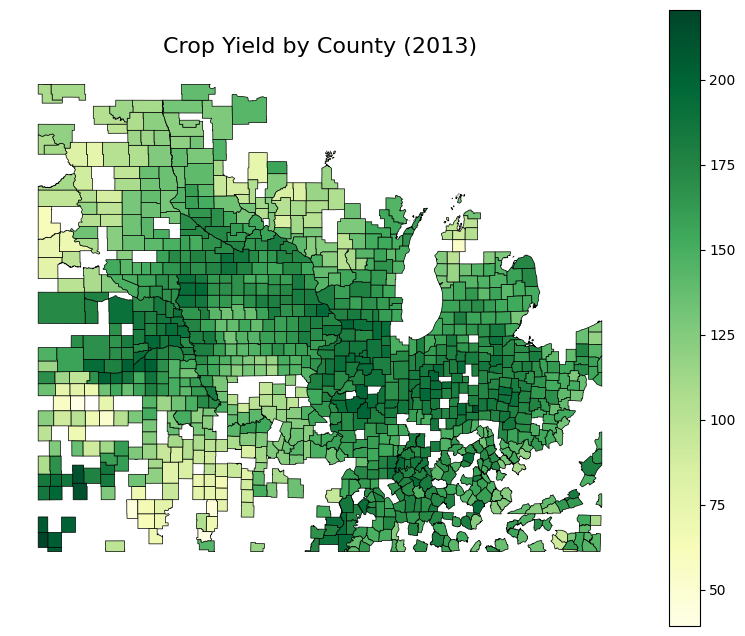

In [45]:
gdf_2013 = merged_gdf[merged_gdf["year"] == 2013]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2013.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2013)", fontsize=16)
ax.axis("off")
plt.show()


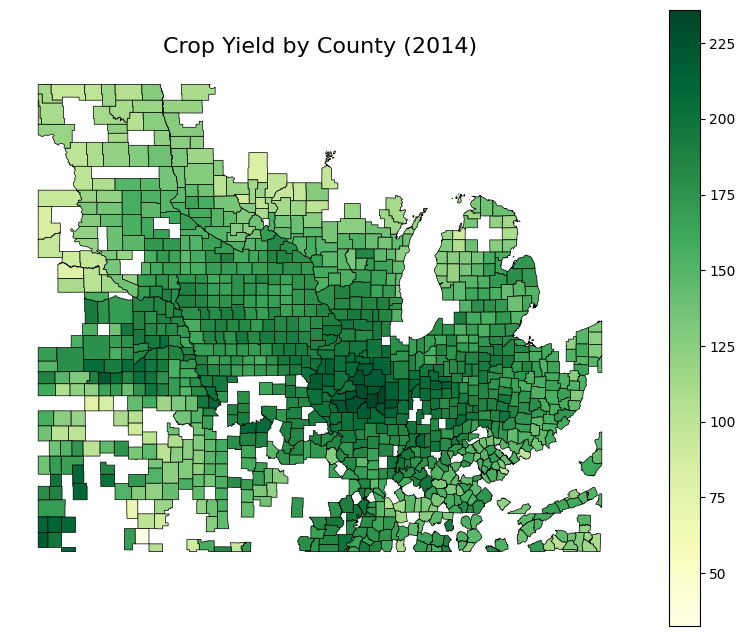

In [46]:
gdf_2014 = merged_gdf[merged_gdf["year"] == 2014]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2014.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2014)", fontsize=16)
ax.axis("off")
plt.show()


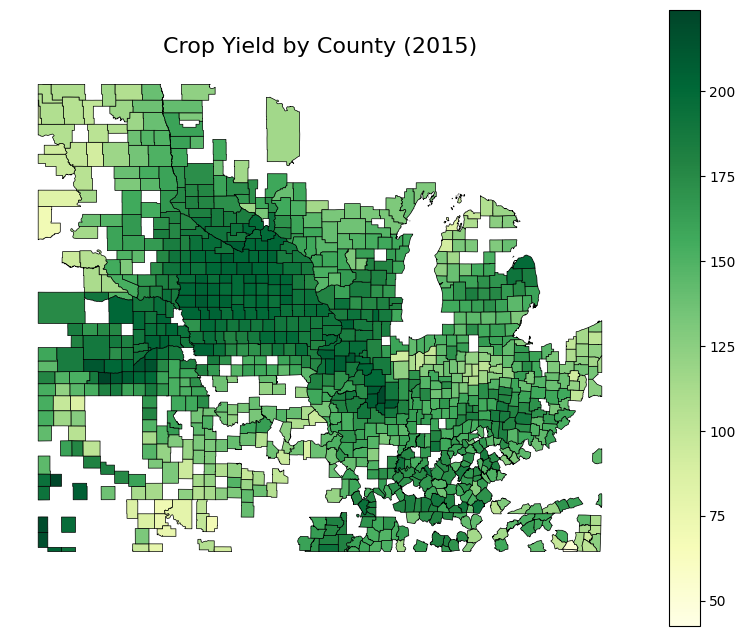

In [47]:
gdf_2015 = merged_gdf[merged_gdf["year"] == 2015]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2015.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2015)", fontsize=16)
ax.axis("off")
plt.show()


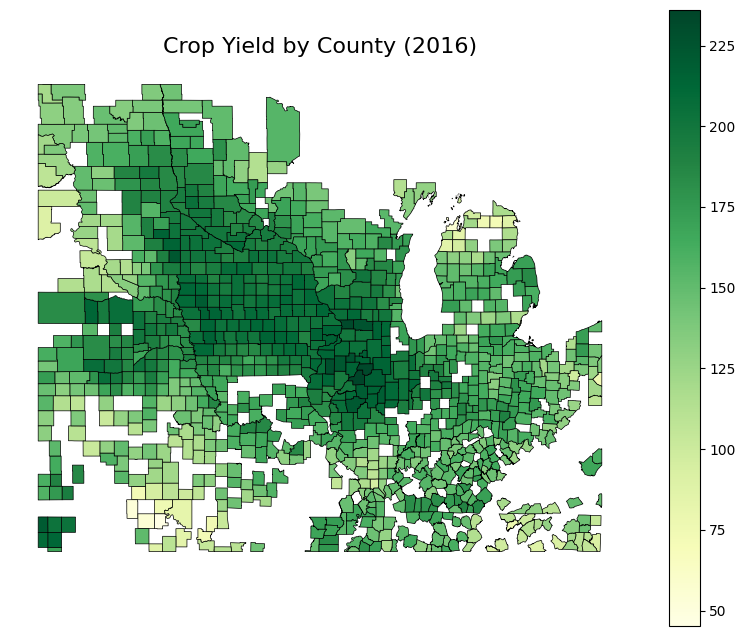

In [48]:
gdf_2016 = merged_gdf[merged_gdf["year"] == 2016]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2016.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2016)", fontsize=16)
ax.axis("off")
plt.show()


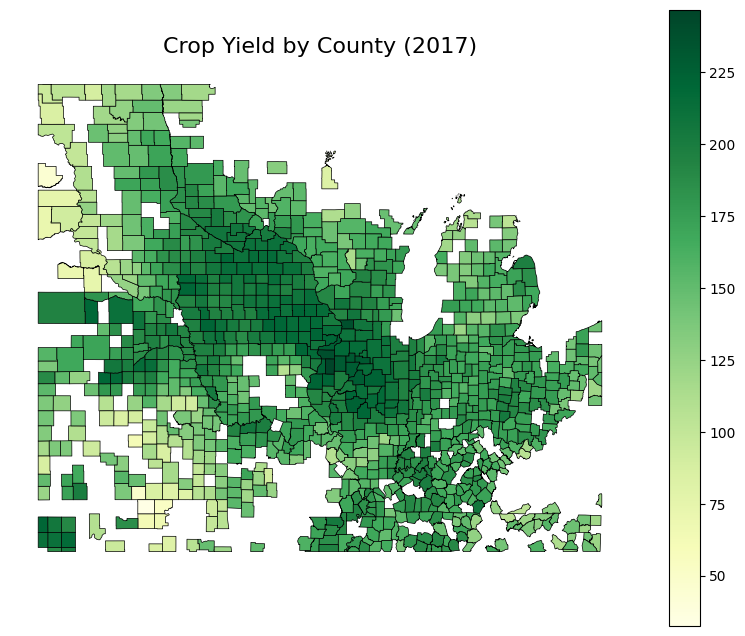

In [49]:
gdf_2017 = merged_gdf[merged_gdf["year"] == 2017]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2017.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2017)", fontsize=16)
ax.axis("off")
plt.show()


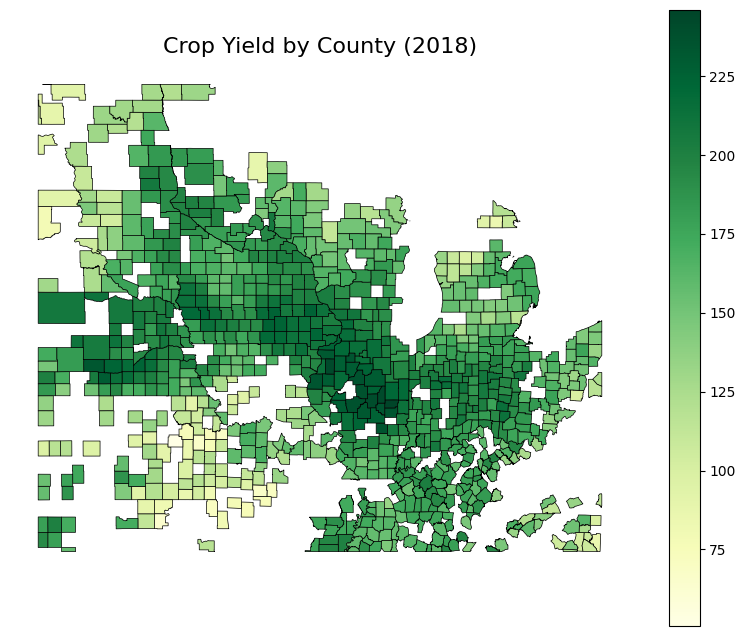

In [50]:
gdf_2018 = merged_gdf[merged_gdf["year"] == 2018]

# Plot
fig, ax = plt.subplots(figsize=(10, 8))
gdf_2018.plot(
    column="yield",
    cmap="YlGn",
    linewidth=0.5,
    edgecolor="black",
    legend=True,
    ax=ax
)

ax.set_title("Crop Yield by County (2018)", fontsize=16)
ax.axis("off")
plt.show()


In [55]:
two_yr = merged_gdf[merged_gdf['year'].isin([1980, 1981])]
two_yr['year'].value_counts()

,count
year,
1981,1329
1980,1302


In [56]:
import json

# Ensure CRS is WGS84 (lat/lon)
two_yr = two_yr.to_crs(epsg=4326)

# Convert GeoDataFrame to GeoJSON
geojson_data = json.loads(two_yr.to_json())

In [57]:
import plotly.graph_objects as go

tolerance = 0.01

two_yr['geometry'] = two_yr['geometry'].simplify(tolerance, preserve_topology=True)

years = sorted(two_yr['year'].unique())

# Create figure
fig = go.Figure()

for yr in years:
    df_yr = two_yr[two_yr['year'] == yr]
    fig.add_trace(
        go.Choroplethmapbox(
            geojson=geojson_data,
            locations=df_yr['ID_2'],
            z=df_yr['yield'],
            featureidkey='properties.ID_2',
            colorscale="YlGn",
            zmin=two_yr['yield'].min(),
            zmax=two_yr['yield'].max(),
            visible=(yr == years[0]),  # show first year initially
            name=str(yr)
        )
    )

# Dropdown buttons
buttons = [
    dict(
        label=str(yr),
        method="update",
        args=[{"visible": [y == yr for y in years]},  # toggle visibility
              {"title": f"Corn Yield {yr}"}]
    )
    for yr in years
]

# Layout
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_zoom=5,
    mapbox_center={"lat": 41.5, "lon": -93.5},
    updatemenus=[dict(active=0, buttons=buttons, x=0.1, y=1.15)]
)


output_path = '/content/drive/MyDrive/corn_yield_choropleth.html'
fig.write_html(output_path)

print(f"Dashboard saved to: {output_path}")

# try w/ two plots locally

Dashboard saved to: /content/drive/MyDrive/corn_yield_choropleth.html
